It is built around Kaggle’s “Generative Dog Images” competition, whose overview and dataset can be found here.

The competition tasks participants with generating convincing images of dogs, providing an accessible gateway to Generative Adversarial Networks (GANs).

Generative Adversarial Networks, first proposed by Ian Goodfellow in 2014, pit a generator and a discriminator against each other in a minimax game: the generator learns to create data that mimic the training distribution, while the discriminator learns to identify real versus synthetic samples.

In this challenge, you train a GAN to synthesize dog images. There are no explicit labels to predict; instead, your submissions are judged on how confidently pre-trained models recognize your creations as dogs. Look closely at the sample outputs—can you spot which are genuine and which are generated?

This notebook adapts and extends two primary references:

    TensorFlow tutorial: “Deep Convolutional Generative Adversarial Network.”
    https://www.tensorflow.org/tutorials/generative/dcgan

    Kaggle starter notebook: “GAN Dogs Starter.”
    https://www.kaggle.com/code/wendykan/gan-dogs-starter/notebook

## Data
The Stanford Dogs dataset contains images of 120 breeds of dogs from around the world. This dataset has been built using images and annotation from ImageNet for the task of fine-grained image categorization. Details about an dthe data could be found on following website: http://vision.stanford.edu/aditya86/ImageNetDogs/.

The train data could be also found at [Kaggle competition page](https://www.kaggle.com/competitions/generative-dog-images/data)

## Importing libraries

In [ ]:
import tensorflow as tf
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers, Sequential
import time
from IPython import display
import xml.etree.ElementTree as ET # for parsing XML

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# set Kaggle API for download and submission
from kaggle.api.kaggle_api_extended import KaggleApi

## Exploratory Data Analysis (EDA)

## Download data

I downloaded the data locally and saved it into my workdir of the project. 

In [2]:
# User and API key is stored in config
import config

# set user and API key
os.environ['KAGGLE_USERNAME'] = config.KAGGLE_USERNAME
os.environ['KAGGLE_KEY'] = config.KAGGLE_KEY

api = KaggleApi()
api.authenticate()

In [3]:
# Download competition files in data directory
api.competition_download_files("generative-dog-images", path="data")

# unzip files
!unzip -d data "./data/generative-dog-images.zip"
#!rm "./data/nlp-getting-started.zip"

Archive:  ./data/generative-dog-images.zip
  inflating: data/Annotation.zip     
  inflating: data/all-dogs.zip       


In [ ]:
!unzip -d data "./data/Annotation.zip"
!unzip -d data "./data/all-dogs.zip"

Loading Images with TensorFlow

To stream the training images in manageable batches, I use tf.keras.preprocessing.image.ImageDataGenerator—specifically its flow_from_directory method—to read files directly from the dataset folders.
Documentation: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
First-Pass Settings

For a quick proof of concept, each image is:

    Rescaled to 28 × 28 pixels

    Converted to single-channel grayscale

These choices keep memory consumption low and shorten training time while we verify that the pipeline works end-to-end.

In [3]:
# Create data input from flies with keras image generator flow
#BATCH_SIZE = 1024
BATCH_SIZE = 4096
#BATCH_SIZE = 20580  --> OOM

train_datagen = ImageDataGenerator(
#        featurewise_center=True,
        samplewise_center=True,
        samplewise_std_normalization=True,
#        validation_split=0.2,
        dtype='float32',
        rotation_range=20,
#        horizontal_flip=True,
        vertical_flip=True
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data",
#    target_size = (64, 64), # This is taget size for submission
    target_size = (28, 28),
#    subset='training',
#    color_mode='rgb',
    color_mode='grayscale',
    classes=None,
    #class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    save_to_dir=None,
    interpolation='nearest',
)

Found 41163 images belonging to 3 classes.


## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

The generator model transforms a random noise vector (the seed) into a synthetic image using a series of upsampling layers. It begins with a Dense layer that projects the noise into a low-resolution feature map, then applies multiple Conv2DTranspose layers to scale this up to the final image dimensions of 28×28×1.

Key architectural elements include:

    tf.keras.layers.Conv2DTranspose for upsampling the feature maps

    tf.keras.layers.LeakyReLU as the activation function for hidden layers

    tanh activation in the final layer to constrain pixel values between –1 and 1 (suitable for normalized grayscale images)

This architecture encourages the generator to learn progressively more complex spatial patterns at each resolution level.

In [ ]:
def make_generator_model():
    """Return a DCGAN generator identical to the original but defined
    in a single Sequential call for lower Python overhead.
    All hyper‑parameters, layer order, and variable names remain unchanged.
    """
    return Sequential([
        layers.Dense(7 * 7 * 256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((7, 7, 256)),

        layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'),
    ], name="generator")

Use the (as yet untrained) generator to create an image.

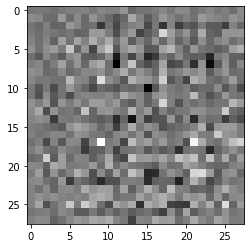

In [5]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

Check the summary of the model and the trainable parameters:

In [6]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1254400   
                                                                 
 batch_normalization (BatchN  (None, 12544)            50176     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 12544)             0         
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 128)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 7, 7, 128)        5

### The Discriminator

The discriminator is a CNN-based image classifier.

In [7]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [8]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00034365]], shape=(1, 1), dtype=float32)


Check the summary of the model and the trainable parameters:

In [9]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 64)        1664      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 128)         204928    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten (Flatten)           (None, 6272)             

## Define the loss and optimizers

Define loss functions and optimizers for both models.

In [10]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [11]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [12]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [13]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [14]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop

In [15]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
@tf.function
def train_step(images):
    """Single training step compiled with `tf.function` for speed.

    Notes
    -----
    • Keeps the original variable names (generator, discriminator, etc.).
    • Removes Pandas operations inside the graph; log losses outside the function to avoid autograph slow‑downs.
    """
    # Generate random noise for the generator input
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    # Calculate gradients once the forward pass is complete
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply the gradients to update network weights
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    # Optionally return the losses for external logging / monitoring
    return gen_loss, disc_loss

In [ ]:
def train(dataset, epochs, iniepochs: int = 0):
    """Run `epochs` of training while minimising Python overhead.

    Parameters
    ----------
    dataset : tf.data.Dataset
        Infinite or long‑running dataset yielding `(image_batch, label)` pairs.
    epochs : int
        Number of epochs to train.
    iniepochs : int, optional
        Offset added to epoch counter when continuing training from a checkpoint.
    """
    # Calculate steps once to avoid recomputing every epoch
    steps_per_epoch = tf.cast(tf.math.ceil(20579 / BATCH_SIZE), tf.int64)

    t0_global = time.time()

    for epoch in tf.range(epochs):  # tf.range avoids Python int conversion inside tf.function (if wrapped later)
        t0_epoch = time.time()

        # 1. Iterate exactly `steps_per_epoch` batches; no manual counter needed
        for image_batch, _ in dataset.take(steps_per_epoch):
            train_step(image_batch / 255.0)

        # 2. Visualise progress once per epoch
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + iniepochs + 1, seed)

        # 3. Periodic checkpointing
        if (epoch + 1) % 15 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        # 4. Timing diagnostics
        epoch_time   = time.time() - t0_epoch
        total_time   = time.time() - t0_global
        print(f"Time for epoch {epoch + iniepochs + 1} is {epoch_time:.2f} sec")
        print(f"Time so far        : {total_time:.2f} sec")

**Generate and save images**

In [18]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(10, 10))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.imshow(predictions[i, :, :, 0] * 255, cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

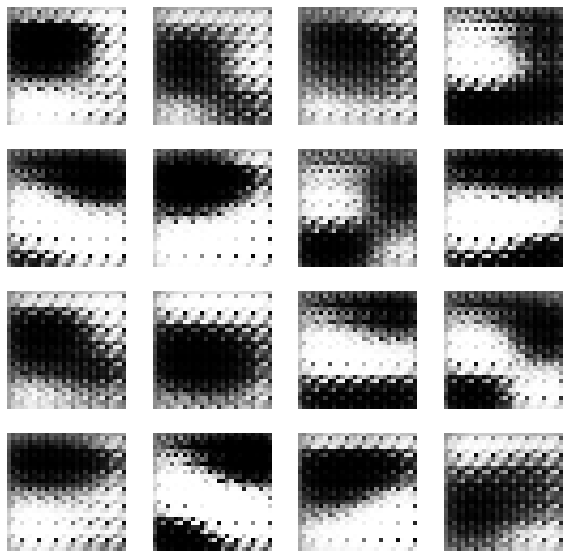

In [23]:
train(train_generator, epochs=EPOCHS, iniepochs=0)

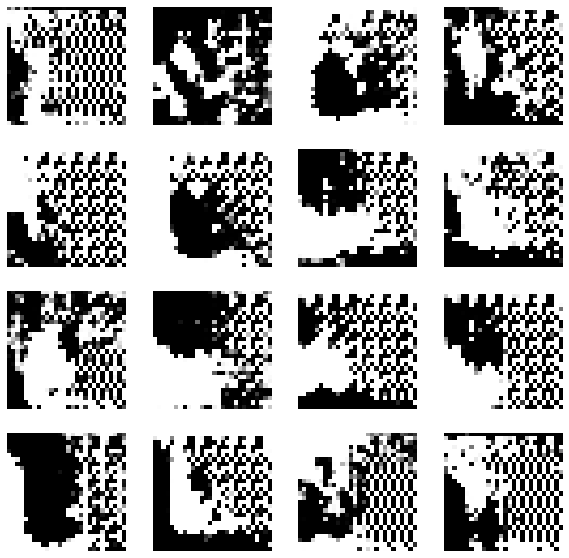

Time for epoch 2000 is 41.10851740837097 sec
Time so far is 20597.801152706146 sec


In [54]:
# continue training
train(train_generator, epochs=500, iniepochs=1500)

Restore the latest checkpoint.

In [64]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

We could also display a single image from training for a given epoch

In [86]:
# Display a single image using the epoch number
def display_image(epoch_no):
    return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

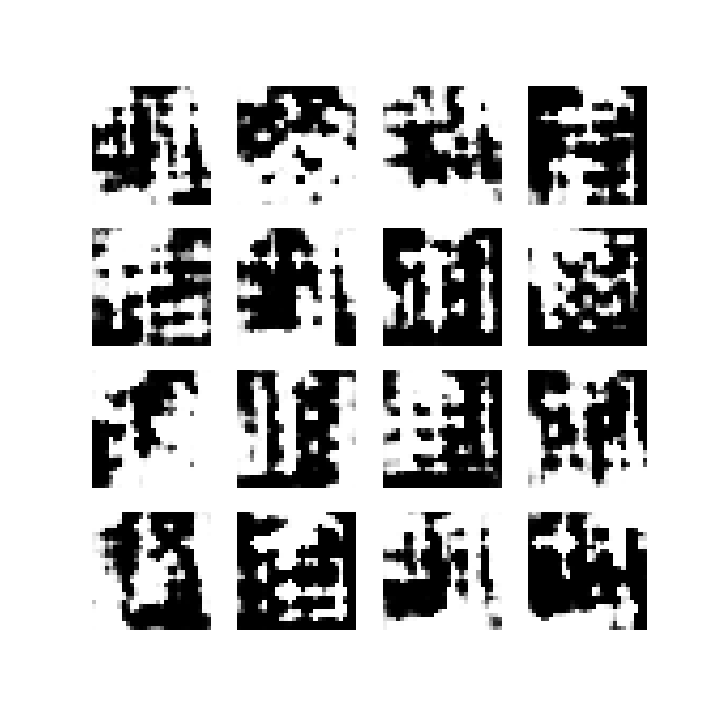

In [48]:
display_image(500)

As demonstrated in the video, the current model struggles to generate convincing outputs—even after 2,000 training epochs. The generator produces mostly abstract, fluctuating black-and-white patterns rather than recognizable dog images.

This limited performance is likely due to:

    Simplified model architecture

    Use of grayscale instead of color

    Low resolution (28×28 pixels)

To address these constraints, the next phase of the project will involve increasing the image resolution to 64×64 and enabling full RGB color, allowing the network to learn and represent more complex visual features.

# Change Network to final size of 64x64 and color images

The ImageDataGenerator has to be changes to rgb images and different resolution.

In [ ]:
def generate_and_save_images(model, epoch, test_input):
    """Generate a fixed grid of images and save to disk.

    Parameters
    ----------
    model : tf.keras.Model
        Trained generator.
    epoch : int
        Current epoch number (used in filename).
    test_input : tf.Tensor
        Latent vectors used for inference; keeps sample grid consistent across epochs.
    """
    # Inference mode ensures layers such as BatchNorm behave deterministically
    predictions = model(test_input, training=False)

    # Scale to [0,255] and convert to uint8 for faster rendering
    images_uint8 = tf.clip_by_value(predictions * 255.0, 0, 255)
    images_uint8 = tf.cast(images_uint8, tf.uint8).numpy()

    fig, axes = plt.subplots(4, 4, figsize=(10, 10))
    axes = axes.flatten()

    for img, ax in zip(images_uint8, axes):
        ax.imshow(img[:, :, 0], cmap='gray')  # Images are single‑channel
        ax.axis('off')

    # Remove any unused subplots (if `test_input` < 16)
    for ax in axes[len(images_uint8):]:
        ax.remove()

    fig.tight_layout(pad=0)
    fig.savefig(f"image_at_epoch_{epoch:04d}.png")
    plt.show()

Found 41163 images belonging to 3 classes.


To accommodate the new 64×64×3 output format, the generator architecture was upgraded accordingly:

    The model now outputs full-color (RGB) images instead of grayscale.

    The network depth and complexity were increased to handle the added dimensionality.

    An additional convolutional block was introduced to improve feature richness during upsampling.

Initially, sigmoid was used as the activation function in the final layer since it conveniently maps pixel values between 0 and 1, making visualization straightforward.

However, further testing revealed that tanh produced sharper and more coherent images, better suited to GAN training dynamics. The visual differences between activation functions are illustrated in the results section below.

In [ ]:
def make_generator_model():
    """Return an optimized DCGAN generator with the new 8×8→64×64 architecture.

    Layer order, hyper‑parameters, noise levels, and activation remain
    unchanged—only the boilerplate is condensed into a single `Sequential`
    definition to trim Python overhead.
    """
    return Sequential([
        layers.Dense(8 * 8 * 1024, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((8, 8, 1024)),

        layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False),
        layers.GaussianNoise(0.1),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.GaussianNoise(0.1),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.GaussianNoise(0.1),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'),
    ], name="generator")

TensorShape([1, 64, 64, 3])

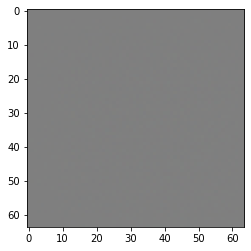

In [21]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

Check the summary of the model and the trainable parameters:

In [22]:
generator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 65536)             6553600   
                                                                 
 batch_normalization_3 (Batc  (None, 65536)            262144    
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 65536)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 1024)        0         
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 8, 8, 256)        6553600   
 ranspose)                                                       
                                                                 
 gaussian_noise (GaussianNoi  (None, 8, 8, 256)       

The discriminator has also to be adopted to changed input shape.

In [23]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
  
    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [24]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00566749]], shape=(1, 1), dtype=float32)


Check the summary of the model and the trainable parameters:

In [25]:
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 32, 32, 256)       19456     
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 32, 32, 256)       0         
                                                                 
 dropout_2 (Dropout)         (None, 32, 32, 256)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 512)       3277312   
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 16, 16, 512)       0         
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 512)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 1024)       

In [ ]:
@tf.function
def train_step(images):
    """One compiled training step for both generator and discriminator.

    * Scales generator output from [−1,1] (tanh) to [0,1] before the discriminator,
      mirroring the real‑image range expected by `images`.
    """
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True) * 0.5 + 0.5  # map tanh → [0,1]

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss  = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator     = gen_tape.gradient(gen_loss,  generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator,     generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss  # for optional external logging

In [27]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)* 0.5 + 0.5 # because of -1/1 from tanh

    fig = plt.figure(figsize=(10, 10))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
        plt.imshow(predictions[i, :, :, :])
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

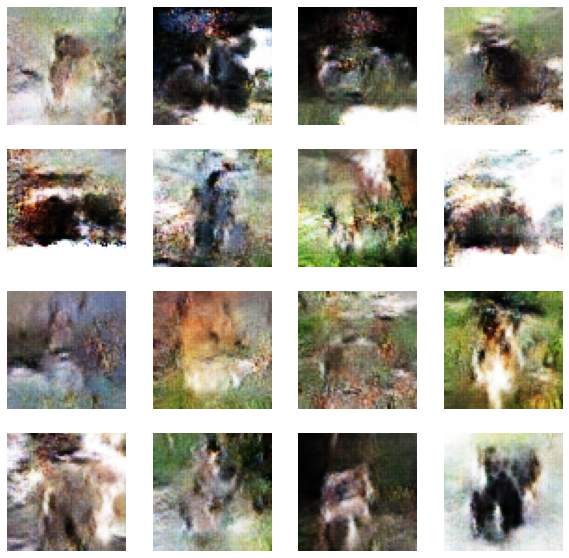

Time for epoch 500 is 248.58120393753052 sec
Time so far is 133405.20109510422 sec


In [71]:
train(train_generator, epochs=500, iniepochs=0)

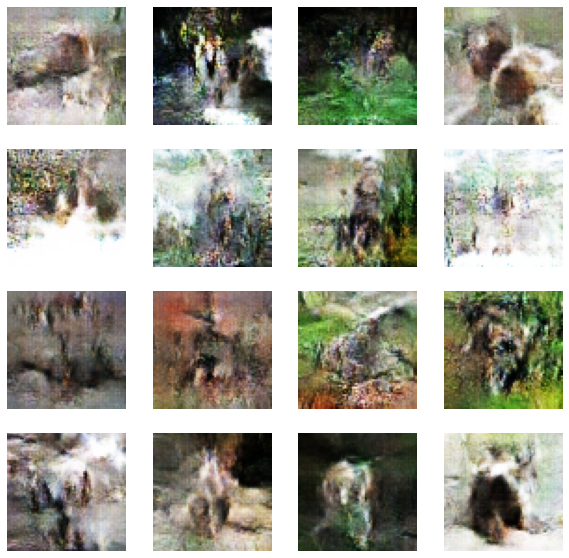

Time for epoch 650 is 283.7444591522217 sec
Time so far is 41246.268580913544 sec


In [116]:
# continue training
history = train(train_generator, epochs=150, iniepochs=500)

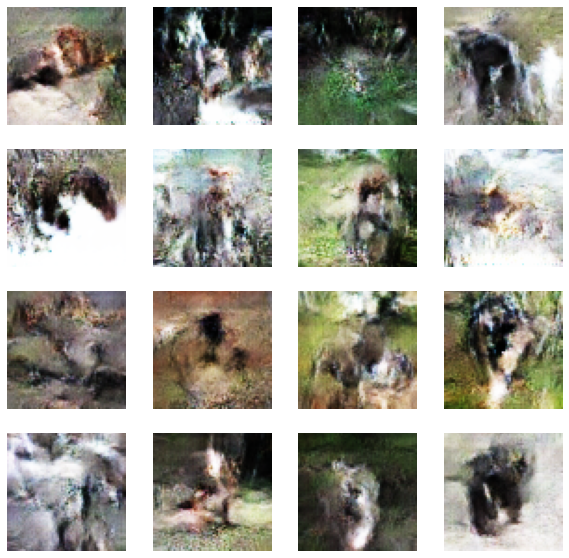

Time for epoch 750 is 252.85971999168396 sec
Time so far is 12733.311705112457 sec


In [125]:
# continue training
train(train_generator, epochs=50, iniepochs=700)

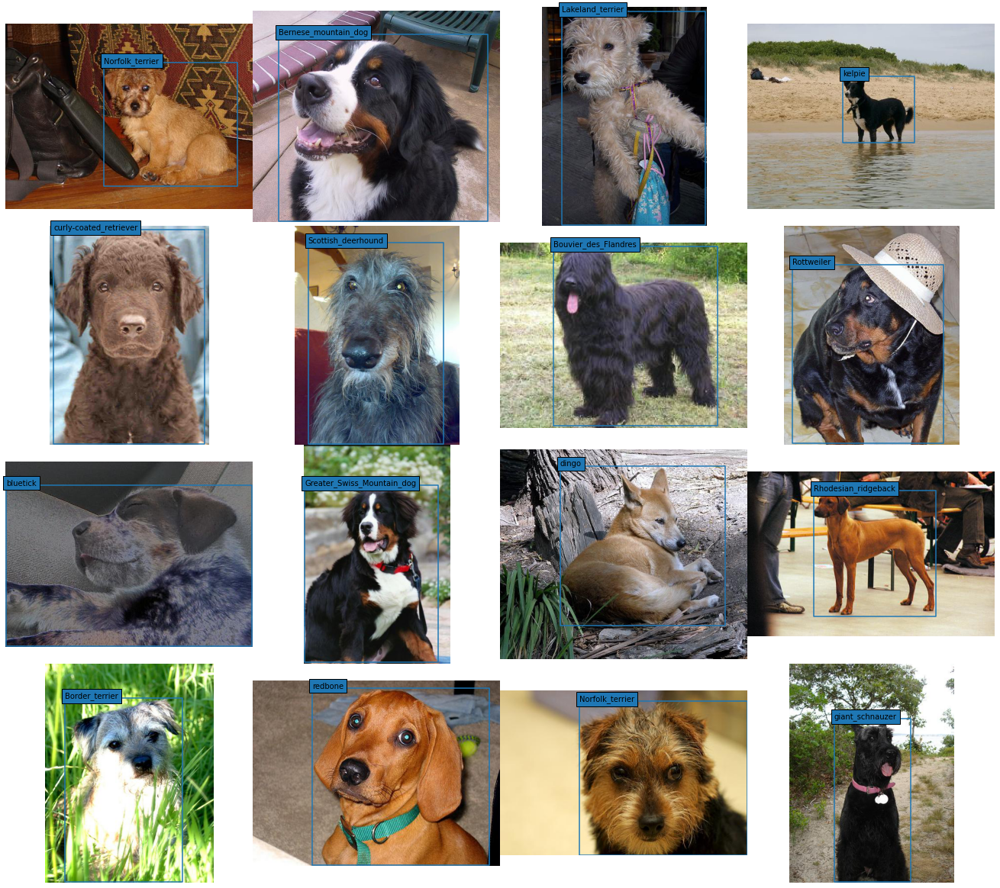

In [37]:
# Import annotations
# This Part is from Kaggle notebook "Show Annotations and Breeds" from competition
# https://www.kaggle.com/code/paulorzp/show-annotations-and-breeds/notebook

breeds = os.listdir('./data/annotation/Annotation/') # list of all breeds

# show some random annotations with bounding box

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    axis.set_axis_off() 
    imgplot = axis.imshow(img)
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin]) # show box
        axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed

plt.tight_layout(pad=0, w_pad=0, h_pad=0)

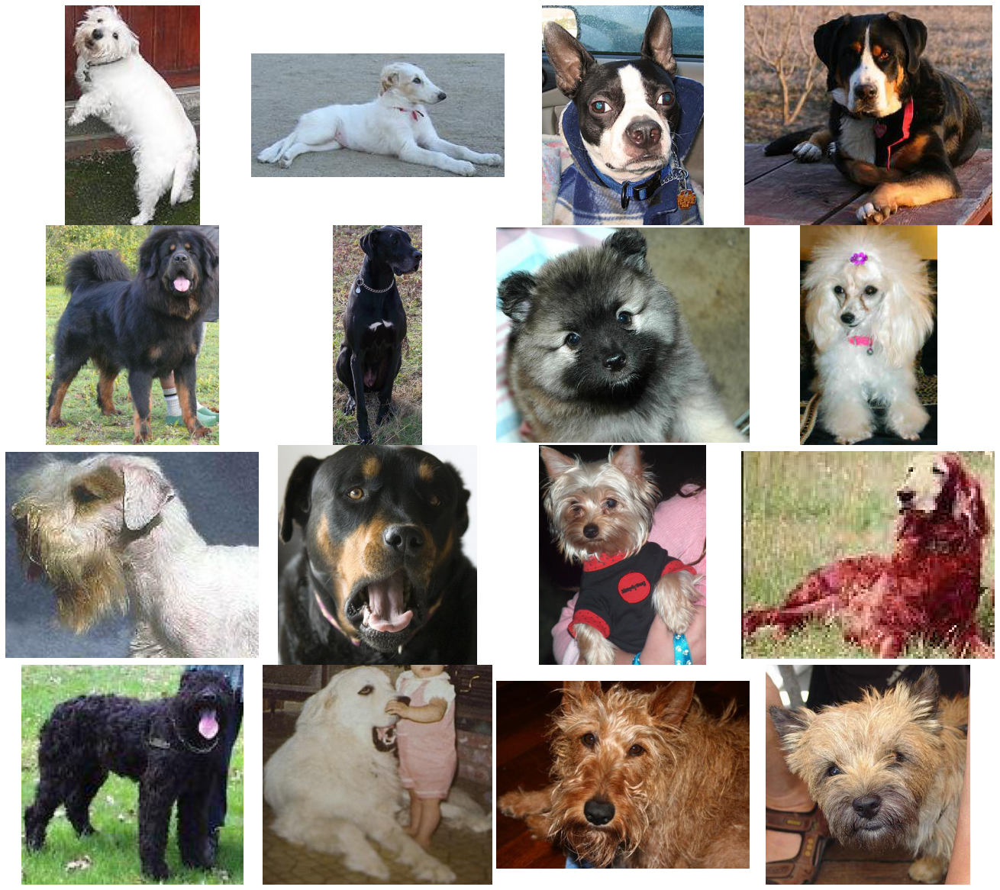

In [38]:
# now try to crop random images to annotations

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    img = img.crop((xmin, ymin, xmax, ymax))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(img)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

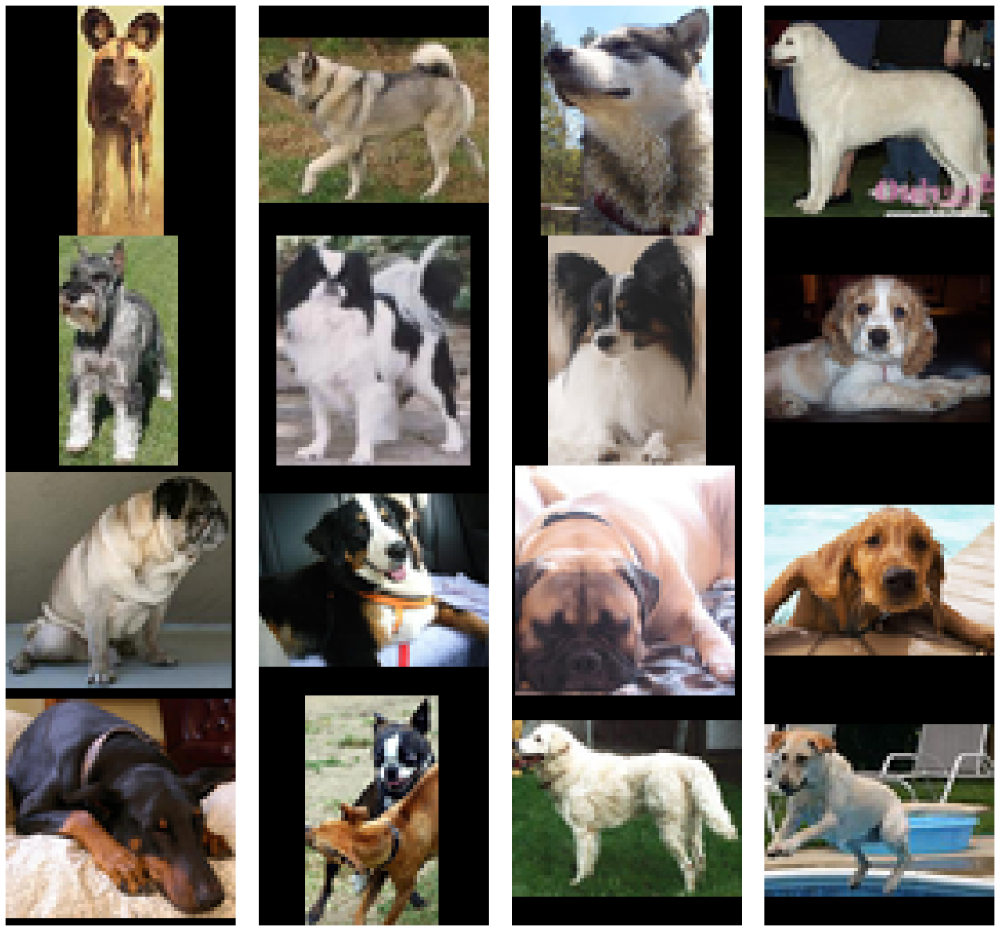

In [39]:
# now try to crop and resize random images to target size and keep aspect ration
# This usefull because tensoflow flow from directory could not pad immage or keep aspect ratio
# so all immages have same sice and bounding box is padded with black

# create new black image in taget size
#black = PIL.Image.new("RGB", (640, 640))


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymabx, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    # ratio
#   (int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size))))
    
    img = img.crop((xmin, ymin, xmax, ymax))
    #img = img.resize((64,64), PIL.Image.ANTIALIAS)
    img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
    black = PIL.Image.new(mode="RGB", size=(64, 64))
    
    # center immage
    #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
    black.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(black)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

#black.paste(img)
#plt.imshow(img)

In [215]:
# now crop, resize and pad all images

for breed in breeds:
    for dog in os.listdir('./data/annotation/Annotation/' + breed):
        tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        objects = root.findall('object')
        
        # check if file exist
        if os.path.isfile('./data/all-dogs/' + dog + '.jpg'):
            
            img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
            
            # only one dog per annotation so no additional index needed
            for o in objects:
                bndbox = o.find('bndbox') # reading bound box
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
            img = img.crop((xmin, ymin, xmax, ymax))
            img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
            black = PIL.Image.new(mode="RGB", size=(64, 64))
    
            # center immage
            #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
            black.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))

            black.save("./data/croped/croped/" + breed + "_" + dog + ".jpg")

In [28]:
# Create data input from files with keras image generator flow
BATCH_SIZE = 128

train_datagen = ImageDataGenerator(
        dtype='float32',
#        rotation_range=20,  switched off to keep aspect ration
        horizontal_flip=True,
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data/croped",
    target_size = (64, 64), # This is taget size for submission
    color_mode='rgb',
    classes=None,
    batch_size=BATCH_SIZE,
    shuffle=True,
    save_to_dir=None,
    interpolation='nearest',
)

Found 20579 images belonging to 1 classes.


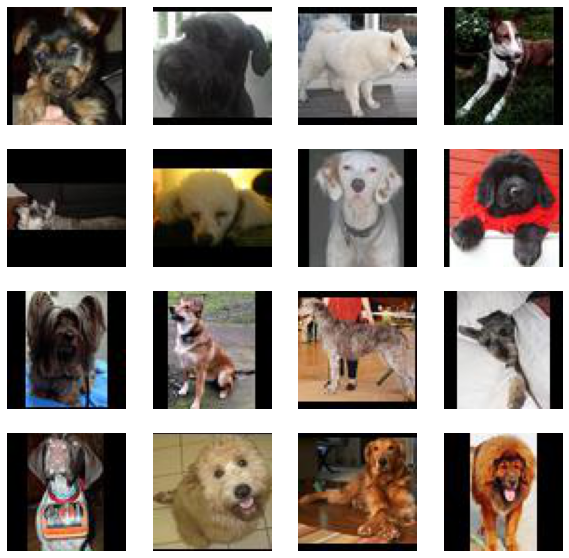

In [29]:
# show some croped images from generator
#plt.imshow(train_generator[0][0][2]/255)

fig = plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i+1)
    #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
    plt.imshow(train_generator[0][0][i]/255)
    plt.axis('off')

In [30]:
# add some more noise
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 1024)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')) 

    return model

TensorShape([1, 64, 64, 3])

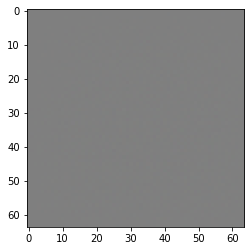

In [31]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

Check the summary of the model and the trainable parameters:

In [32]:
generator.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 65536)             6553600   
                                                                 
 batch_normalization_7 (Batc  (None, 65536)            262144    
 hNormalization)                                                 
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 65536)             0         
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 1024)        0         
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 8, 8, 256)        6553600   
 ranspose)                                                       
                                                                 
 gaussian_noise_3 (GaussianN  (None, 8, 8, 256)       

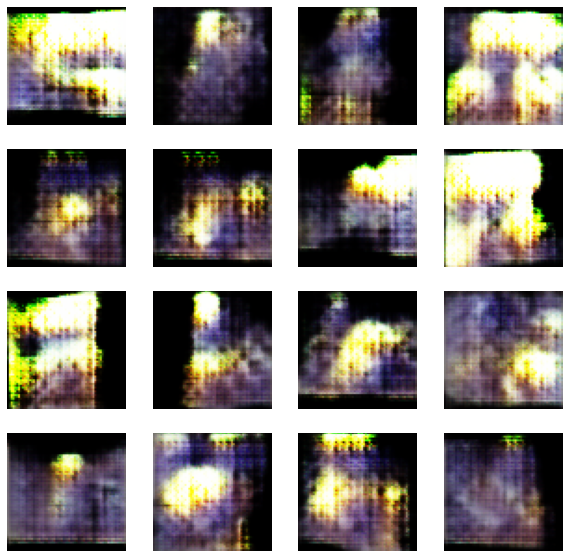

Time for epoch 50 is 247.27329277992249 sec
Time so far is 13258.415976285934 sec


In [33]:
train(train_generator, epochs=50, iniepochs=0)

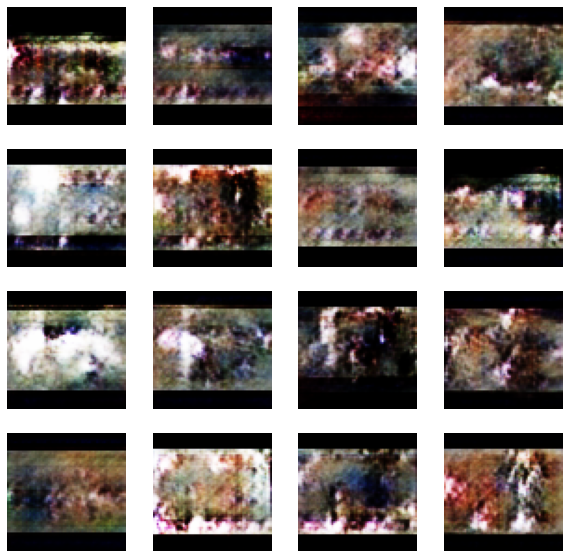

Time for epoch 200 is 254.8795783519745 sec
Time so far is 39550.47582030296 sec


In [34]:
train(train_generator, epochs=150, iniepochs=50)

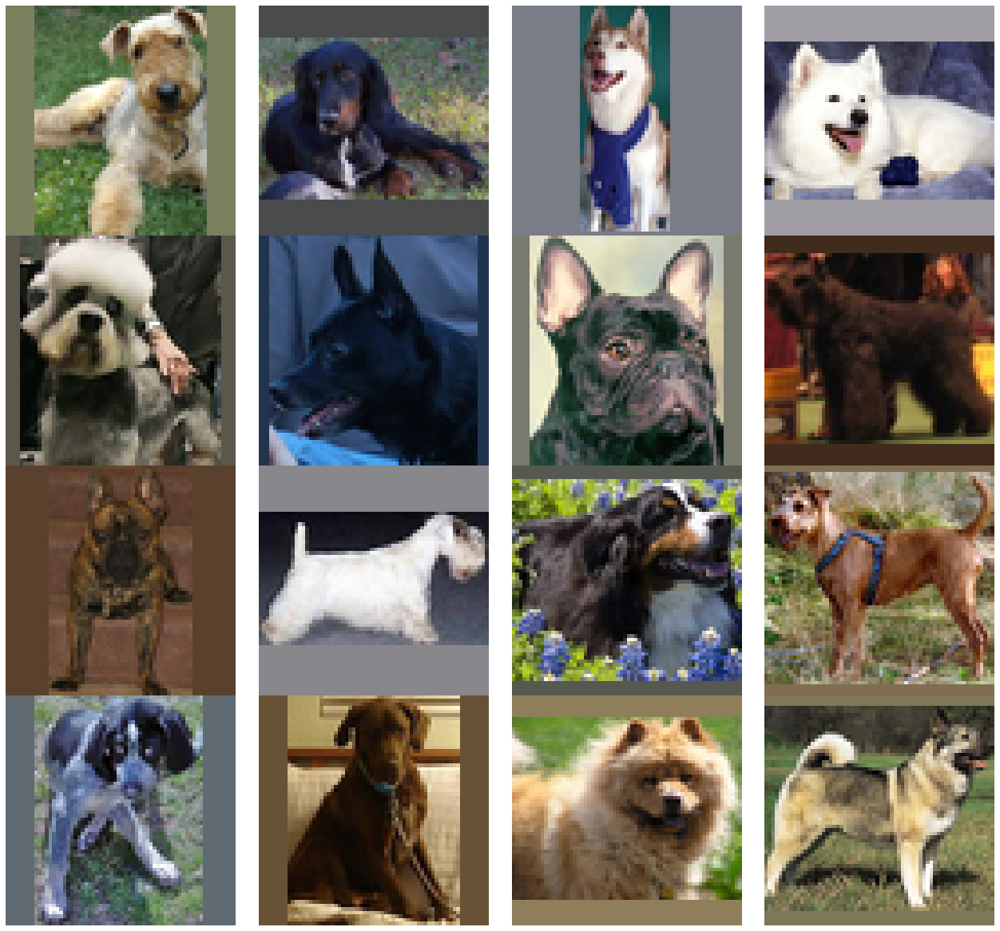

In [71]:
# now try to crop and resize random images to target size and keep aspect ration
# This usefull because tensoflow flow from directory could not pad immage or keep aspect ratio
# so all immages have same sice and bounding box is padded with black

# create new black image in taget size
#black = PIL.Image.new("RGB", (640, 640))


fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(18,16))
for indx, axis in enumerate(axes.flatten()):
    breed = np.random.choice(breeds)
    dog = np.random.choice(os.listdir('./data/annotation/Annotation/' + breed))
    img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
    tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
    root = tree.getroot()
    objects = root.findall('object')
    
    for o in objects:
        bndbox = o.find('bndbox') # reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
#         axis.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymabx, ymax, ymin]) # show box
#         axis.text(xmin, ymin, o.find('name').text, bbox={'ec': None}) # show breed    
    
    # ratio
#   (int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size))))
    
    img = img.crop((xmin, ymin, xmax, ymax))
    #img = img.resize((64,64), PIL.Image.ANTIALIAS)
    img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
    
    # create blank image with average color
    blank = PIL.Image.new(mode="RGB", size=(64, 64), 
                          color=(int(np.mean(np.array(img)[:,:,0])),
                                 int(np.mean(np.array(img)[:,:,1])),
                                 int(np.mean(np.array(img)[:,:,2]))))
    
    # center immage
    #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
    blank.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))
    
    axis.set_axis_off() 
    imgplot = axis.imshow(blank)


plt.tight_layout(pad=0, w_pad=0, h_pad=0)

#black.paste(img)
#plt.imshow(img)

In [72]:
# now crop, resize and pad all images

for breed in breeds:
    for dog in os.listdir('./data/annotation/Annotation/' + breed):
        tree = ET.parse('./data/annotation/Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        objects = root.findall('object')
        
        # check if file exist
        if os.path.isfile('./data/all-dogs/' + dog + '.jpg'):
            
            img = PIL.Image.open('./data/all-dogs/' + dog + '.jpg') 
            
            # only one dog per annotation so no additional index needed
            for o in objects:
                bndbox = o.find('bndbox') # reading bound box
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
            img = img.crop((xmin, ymin, xmax, ymax))
            img = img.resize((int(img.size[0] * (64.0 / max(img.size))), int(img.size[1] * (64.0 / max(img.size)))), PIL.Image.ANTIALIAS)
            blank = PIL.Image.new(mode="RGB", size=(64, 64), 
                                  color=(int(np.mean(np.array(img)[:,:,0])),
                                         int(np.mean(np.array(img)[:,:,1])),
                                         int(np.mean(np.array(img)[:,:,2]))))

            # center immage
            #((64 - img.size[0])/2 ,(64 - img.size[1])/2 )
            blank.paste(img, (int((64 - img.size[0])/2) ,int((64 - img.size[1])/2) ))

            blank.save("./data/croped/croped/" + breed + "_" + dog + ".jpg")

In [28]:
# Create data input from files with keras image generator flow
BATCH_SIZE = 128

train_datagen = ImageDataGenerator(
        dtype='float32',
#        rotation_range=20,  switched off to keep aspect ration
        horizontal_flip=True,
        )


train_generator = train_datagen.flow_from_directory(
    directory="./data/croped",
    target_size = (64, 64), # This is taget size for submission
    color_mode='rgb',
    classes=None,
    batch_size=BATCH_SIZE,
    shuffle=True,
    save_to_dir=None,
    interpolation='nearest',
)

Found 20579 images belonging to 1 classes.


In [29]:
# reduce noise to 0.1
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 1024)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.GaussianNoise(0.1))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')) 

    return model

TensorShape([1, 64, 64, 3])

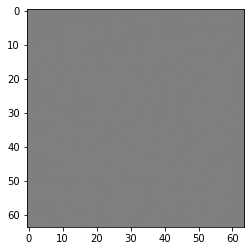

In [30]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

#plt.imshow(generated_image[0, :, :, 0], cmap='gray')
#plt.imshow(generated_image[0, :, :, 0])
plt.imshow(generated_image[0, :, :, :])
generated_image.shape
#generated_image[0, :, :, :] * 127,5

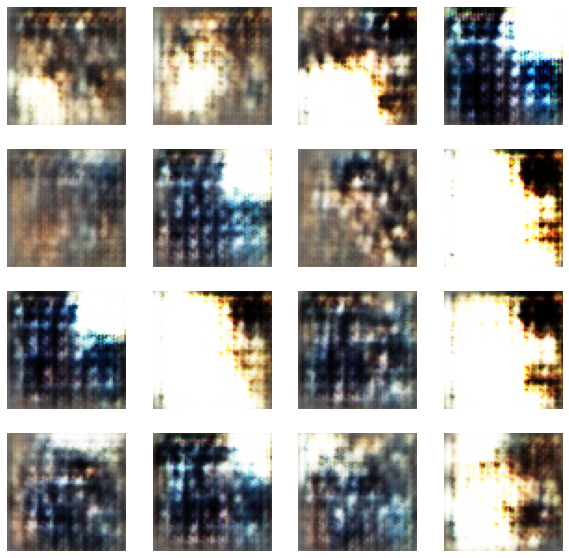

Time for epoch 50 is 254.6866328716278 sec
Time so far is 19772.212921142578 sec


In [31]:
train(train_generator, epochs=50, iniepochs=0)

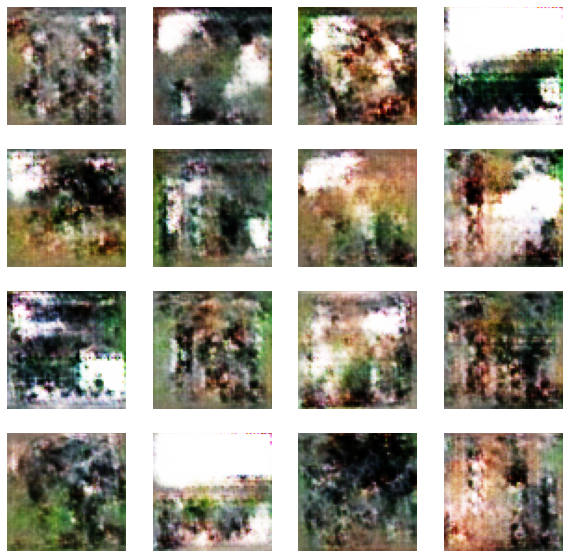

Time for epoch 200 is 255.11516976356506 sec
Time so far is 39638.99661564827 sec


In [32]:
train(train_generator, epochs=150, iniepochs=50)

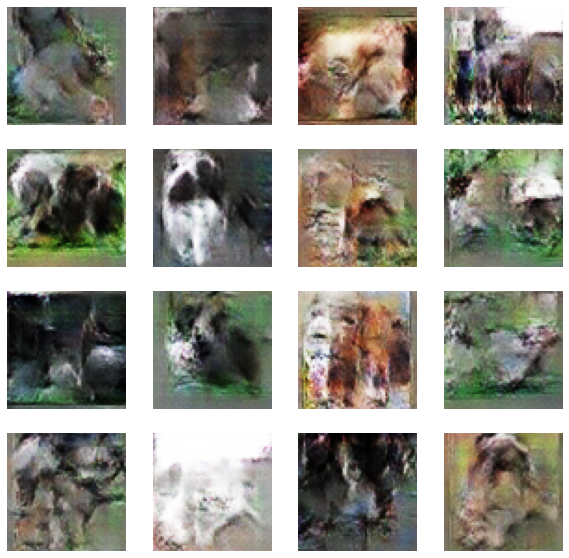

Time for epoch 550 is 255.6823229789734 sec
Time so far is 55660.95562529564 sec


In [34]:
train(train_generator, epochs=200, iniepochs=350)

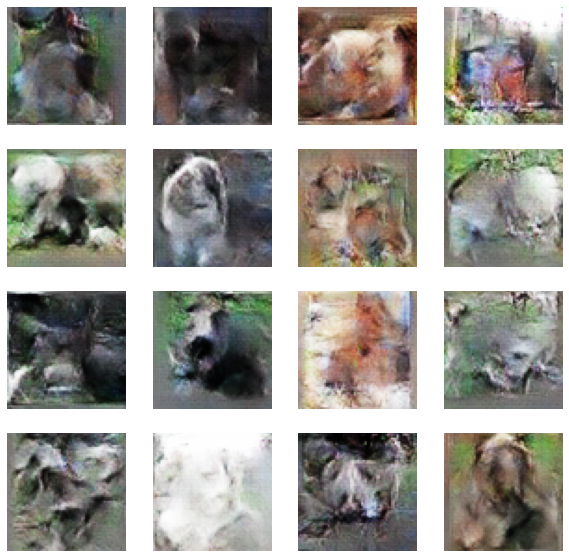

Time for epoch 600 is 255.49133157730103 sec
Time so far is 12734.03732085228 sec


In [35]:
train(train_generator, epochs=50, iniepochs=550)

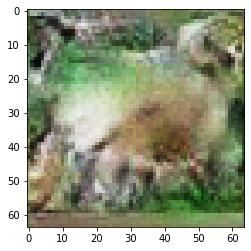

In [162]:
# show single image
generated_image = generator(seed, training=False) * 0.5 + 0.5 # because of -1/1 from tanh

plt.imshow(generated_image[13, :, :, :])
#generated_image[0, :, :, :]

TensorShape([1, 64, 64, 3])

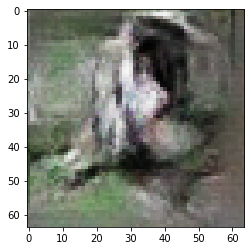

In [161]:
# generate new random immage from noise

noise1 = tf.random.normal([1, 100])
generated_image = generator(noise1, training=False)* 0.5 + 0.5 # because of -1/1 from tanh

plt.imshow(generated_image[0, :, :, :])

generated_image.shape

In [105]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

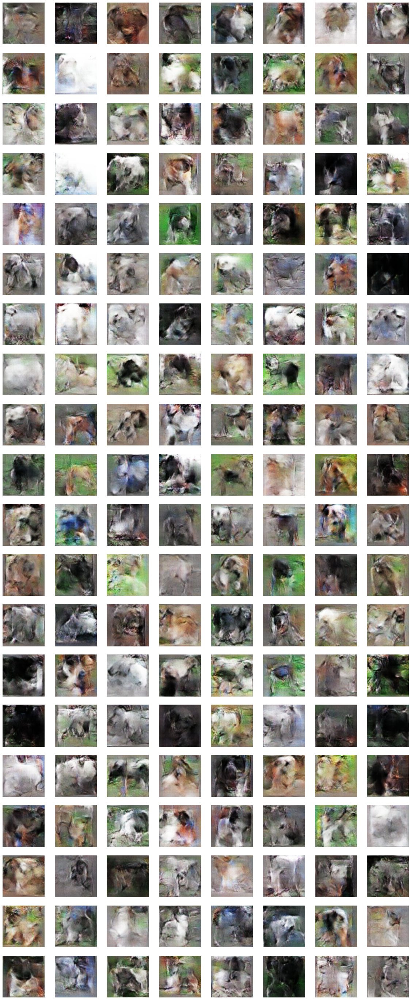

In [86]:
noise_dim = 100
num_examples_to_generate = 160

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

generated_image = generator(seed, training=False)
fig = plt.figure(figsize=(20, 50))

for i in range(generated_image.shape[0]):
        plt.subplot(20, 8, i+1)
        #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5)
        plt.imshow(generated_image[i, :, :, :]* 0.5 + 0.5) # because of -1/1 from tanh
        plt.axis('off')


## Conclusion

GANs have always been a fascinating topic for me, and this project was a great opportunity to explore the mechanics more deeply. It was both fun and educational to build a GAN from scratch, observing firsthand how various design choices affect performance.

To fully understand the architecture, I deliberately avoided using pre-built models and started with a simple implementation. That said, for producing high-quality results more efficiently, leveraging a powerful pre-trained model like StyleGAN2—and fine-tuning it on a dog image dataset—would have been a far more effective approach.

As is often the case in machine learning, the quality of the data played a crucial role in shaping the outputs. The best results came from well-preprocessed images: properly cropped, padded, and resized while preserving aspect ratio.

For future iterations, I see key areas for improvement:

    Enhancing the discriminator architecture for better feedback to the generator

    Implementing real-time loss tracking during training to monitor progress and make informed adjustments

    Investing more time into the training loop design, especially around logging and evaluation

One important lesson I took from this process: if starting over, my top priority would be to integrate a robust monitoring system for losses and training metrics early on, as this provides critical insight into model behavior and stability.